# Functional analysis of gene signatures

In this notebook we will analyze the differentially expressed genes found by DESeq2 on the bulk RNA-seq data, for our case study. 

Two replicates of Exercise Tumor (ET) RNA-seq samples were compared with 2 replicates of Non-Exercise Tumor (NT) RNA-seq samples. 

The DESeq2 analysis resulted in a resLFC_df.tsv file, which we will use here.

In [29]:
pwd

/mnt/storage/r0974221/jupyternotebooks/assignment_1/functional_analysis_gene_signatures


In [3]:
mkdir -p functional_analysis_gene_signatures

In [4]:
cd functional_analysis_gene_signatures/

In [5]:
pwd

/mnt/storage/r0974221/jupyternotebooks/assignment_1/functional_analysis_gene_signatures


In [2]:
# full path results from bulk RNA seq
# /home/luna.kuleuven.be/r0974221/data/jupyternotebooks/assignment_1/bulk_RNA_seq/resLFC_df.tsv

In [15]:
cp /home/luna.kuleuven.be/r0974221/data/jupyternotebooks/assignment_1/bulk_RNA_seq/resLFC_df.tsv .

In [21]:
# Renaming file to deseq.results.tsv
mv resLFC_df.tsv deseq.results.tsv

In [6]:
ls

deseq.results.tsv


In [7]:
head deseq.results.tsv

Genes	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
Sox17	17.9218351322995	0.0567175928080931	0.14291740155147	-0.122261169761646	0.902692183280413	0.999847817557225
Mrpl15	196.706977153318	0.17245659275457	0.159496849929938	1.1349202599006	0.256408730339664	0.999847817557225
Lypla1	663.927686987207	0.0880983772182862	0.15272993090251	0.759890974281584	0.447319757132613	0.999847817557225
Tcea1	89.189070084373	-0.0562815738874985	0.167276006318027	-0.387324493824752	0.69851599451619	0.999847817557225
Atp6v1h	301.397408016249	0.0991751933429822	0.155904291214187	0.711309724268578	0.476892326963495	0.999847817557225
Rb1cc1	236.936023938396	0.000325921275590987	0.159928431890846	0.0690067186636276	0.94498427153017	0.999847817557225
4732440D04Rik	7.87055446656268	-0.0289689672155057	0.118104262515928	-0.26707065561488	0.789414760647489	0.999847817557225
Pcmtd1	447.006175752713	0.143614785641583	0.14910674857427	1.04452662085504	0.296241809355098	0.999847817557225
Gm9826	5.79032460210304	-0

In [9]:
head -1 deseq.results.tsv
grep -n Tff3 deseq.results.tsv
grep -n H19 deseq.results.tsv
grep -n BC023105 deseq.results.tsv

Genes	baseMean	log2FoldChange	lfcSE	stat	pvalue	padj
11188:Tff3	244.759418632065	1.09422282431597	0.167775382888266	3.35222619119848	0.000801644939982028	0.900247267599817
5777:H19	181.233659692708	0.961629939863601	0.167615076333602	3.48929091335083	0.00048430376888486	0.664733828559408
11784:BC023105	44.1189418047297	-0.597018737290996	0.155957722732115	-4.24420707861395	2.19367709086422e-05	0.0677462327586143


## Use arbitrary thresholds to create lists of up- and down-regulated genes
* careful: there are a lot of genes without detected expression, they have NA in the logFC column; so column 3 ($3) should not be "NA" 
* we're using awk to filter this file, selecting only rows where the logFC (column 3, indicated by "\$3") is higher than a threshold; and the padj is lower than a threshold
* print ; => prints all the columns of the rows that fulfill our requirements

In [31]:
awk '$3 != "NA" && $7 < 0.05 {print $1, $3}' deseq.results.tsv

Dbp 0.600911358130066
Meg3 -0.358620106642355
Rian -0.412696152907712


I only got three hits. 
__Genes: Bbp, Meg3, Rian.__ 

### According to NCBI. 
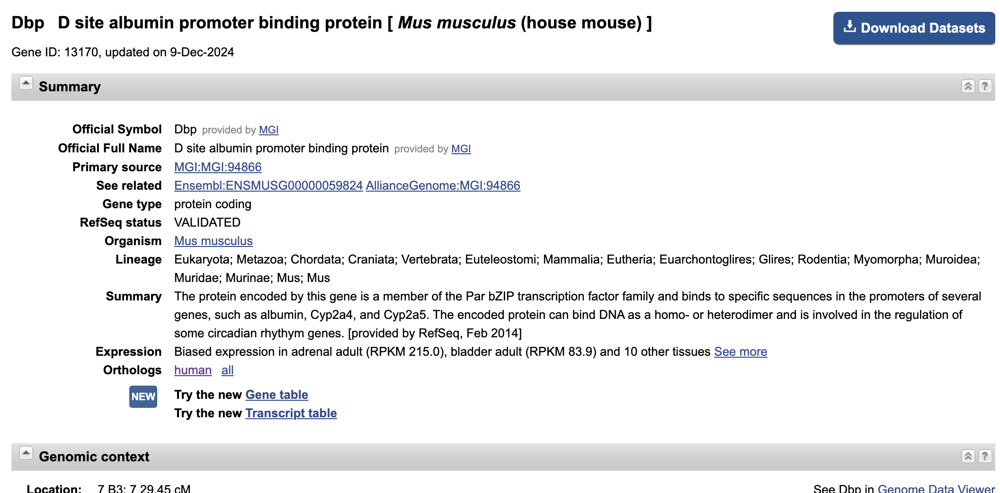
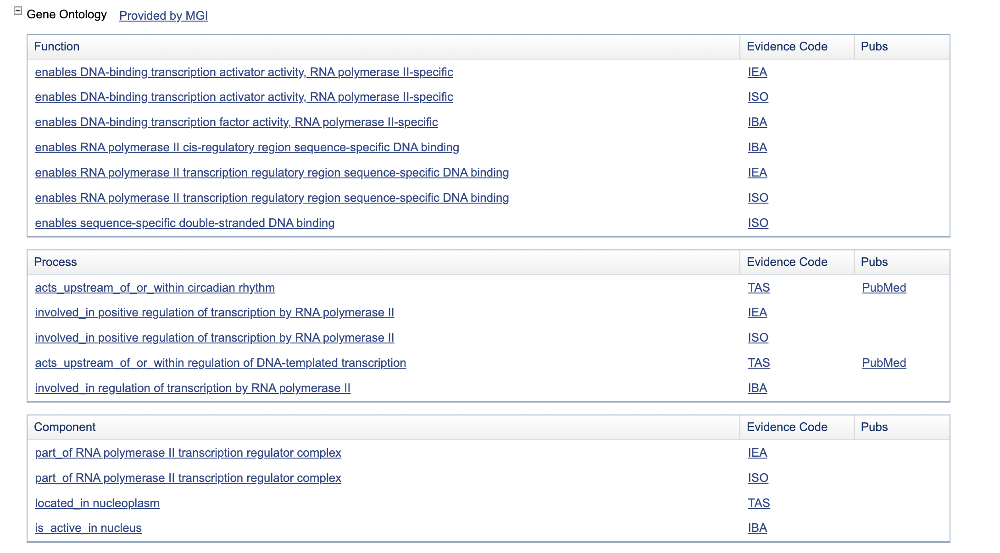
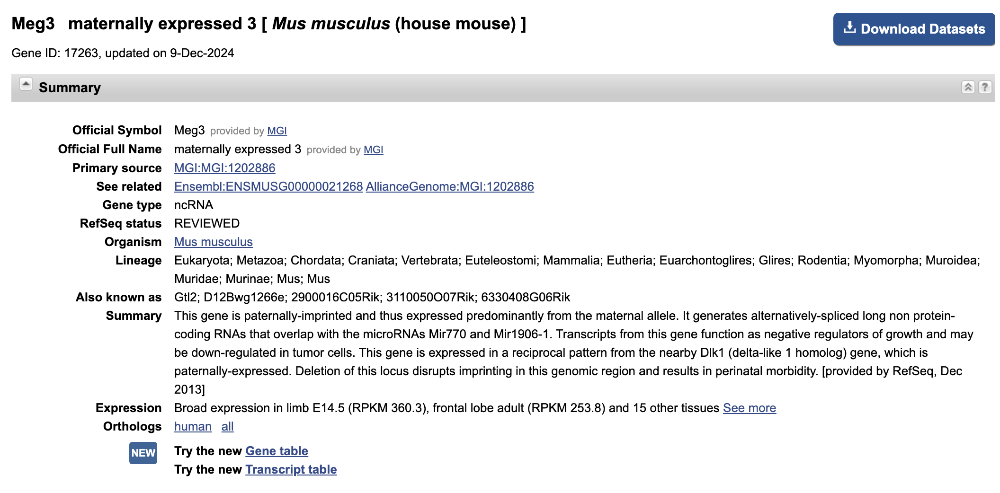
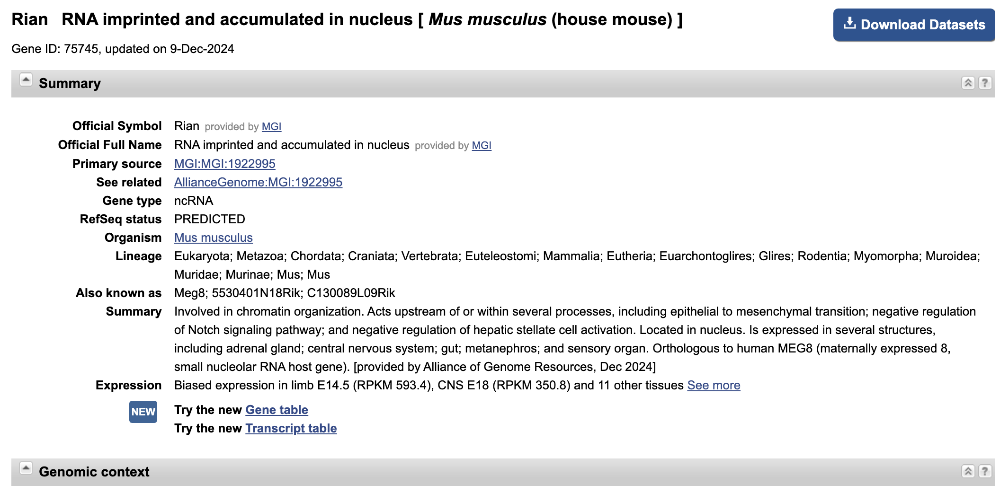

## p-value!!! 
__Because I only had three genes that were significant with the adjusted p value, I decided to use the normal p-value so that I could continue the analysis.__

In [33]:
echo Genes log2fc
awk '$3 != "NA" && $6 < 0.05 {print $1, $3}' deseq.results.tsv | sort -k2,2n


Genes log2fc
BC023105 -0.597018737290996
Hamp -0.587116612367917
Mpeg1 -0.496117323614385
Igtp -0.494145544652141
H2-Ab1 -0.489154516807647
Cd74 -0.488467129463546
H2-Aa -0.485518283479065
H2-Q6 -0.479341966930234
Pnrc1 -0.476176244159032
Irgm2 -0.473270891121935
Fam49a -0.461333186317384
Gltp -0.451235365644013
Fam129a -0.451042458934577
Myof -0.445109660082374
Arntl -0.437561478972717
Itsn1 -0.436709537062332
H2-Eb1 -0.432590342204404
Igfbp3 -0.429179141465776
Ppard -0.416249494179656
Rian -0.412696152907712
Ciita -0.41178387170486
Sirpa -0.407885710354397
Neat1 -0.404986255615712
Id2 -0.389315932298426
Tubb5 -0.378579154291826
Gm8995 -0.37548352910093
Kifc3 -0.37062779126953
Nlrc5 -0.369333298960353
Atp11a -0.365679417599946
Lgmn -0.363398262104777
Smo -0.359781969442543
Cxcl9 -0.359190759464003
Meg3 -0.358620106642355
Fgl2 -0.357192920697076
Serpinb9 -0.354393266764286
Cmklr1 -0.352167538947385
Cry1 -0.349648729872041
Rcan2 -0.348549574038935
Ppp1r9b -0.345720297937184
B3galt1 -0.3

## Upregulated Genes 

In [26]:
awk '$3 != "NA" && $3 > 0 && $6 < 0.05 {print $1}' deseq.results.tsv > up-logFC1-p05.txt

## Downregulated Genes

In [27]:
awk '$3 != "NA" && $3 < 0 && $6 < 0.05 {print $1}' deseq.results.tsv > down-logFC1-p05.txt

Counting number of up and down regulated genes

In [28]:
wc -l up-logFC1-p05.txt
wc -l down-logFC1-p05.txt

131 up-logFC1-p05.txt
102 down-logFC1-p05.txt


## Mousemine.org

results were lacking

## g:Profiler

### Up regulated genes
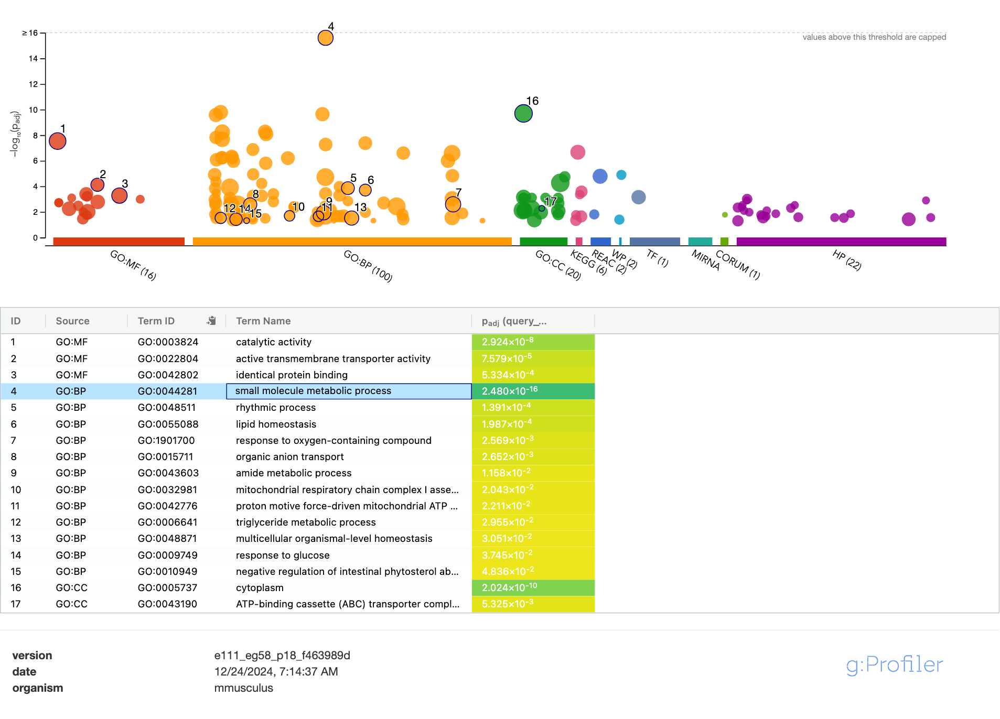

### Down Regulated genes
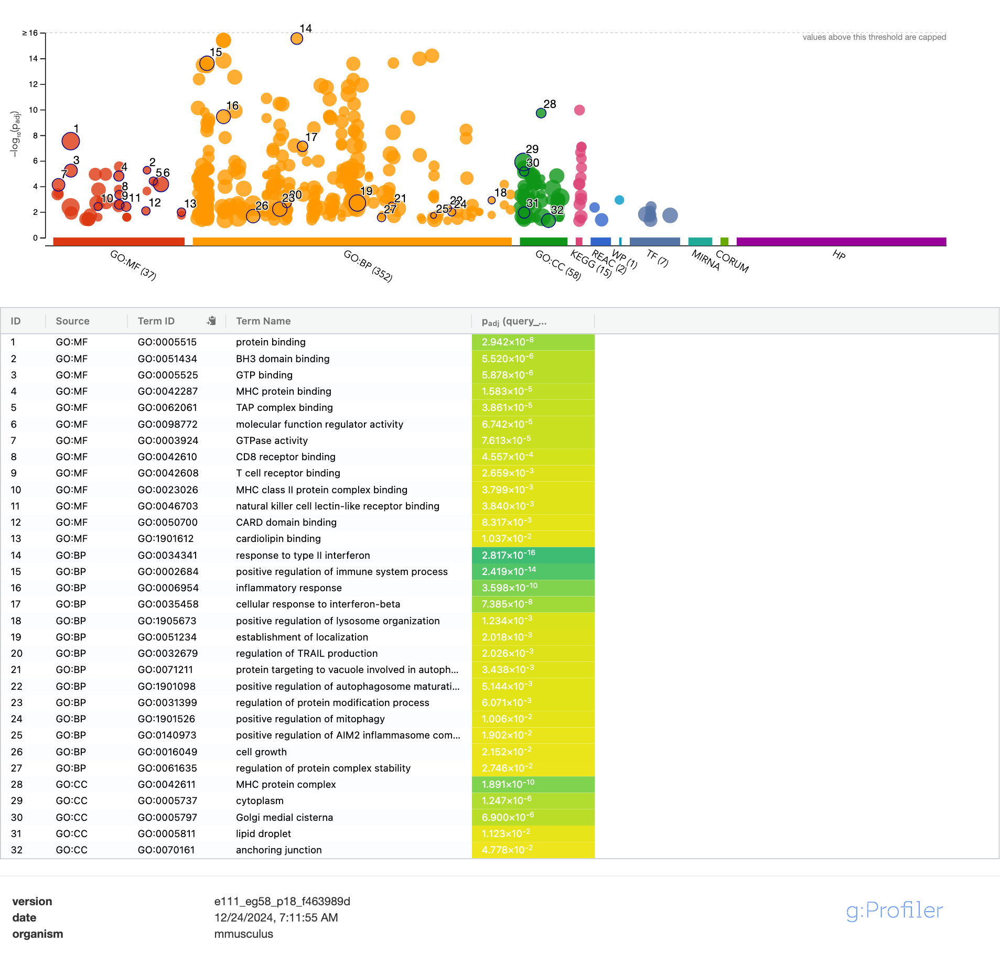

## GORilla
Sort all genes descending by their logFC or padj; here we use logFC

In [36]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene | head

Tff3
H19
Bmp8b
Nr1d1
Zbtb16
Dbp
Lepr
Adcy1
Cela1
Sqle
grep: write error: Broken pipe
sort: write failed: 'standard output': Broken pipe
sort: write error


In [37]:
cat deseq.results.tsv | sort -k 3,3gr | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCdesc.txt

### Most up regulated genes 
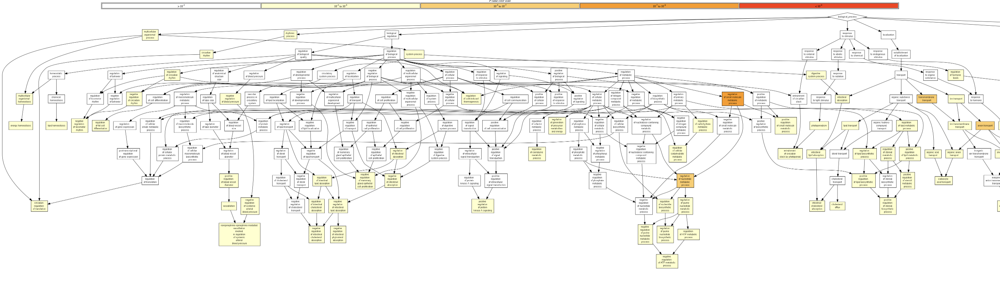
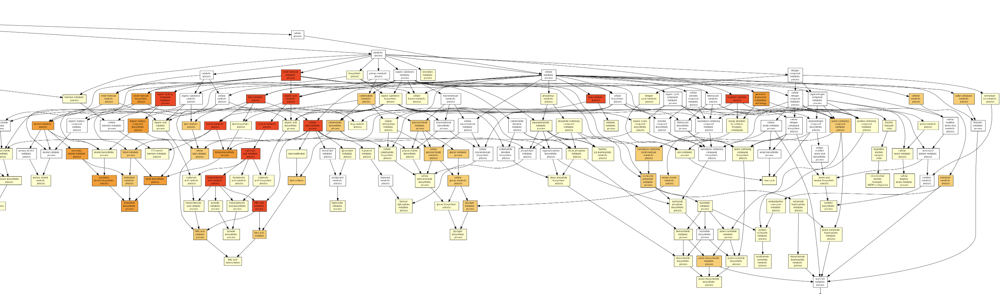
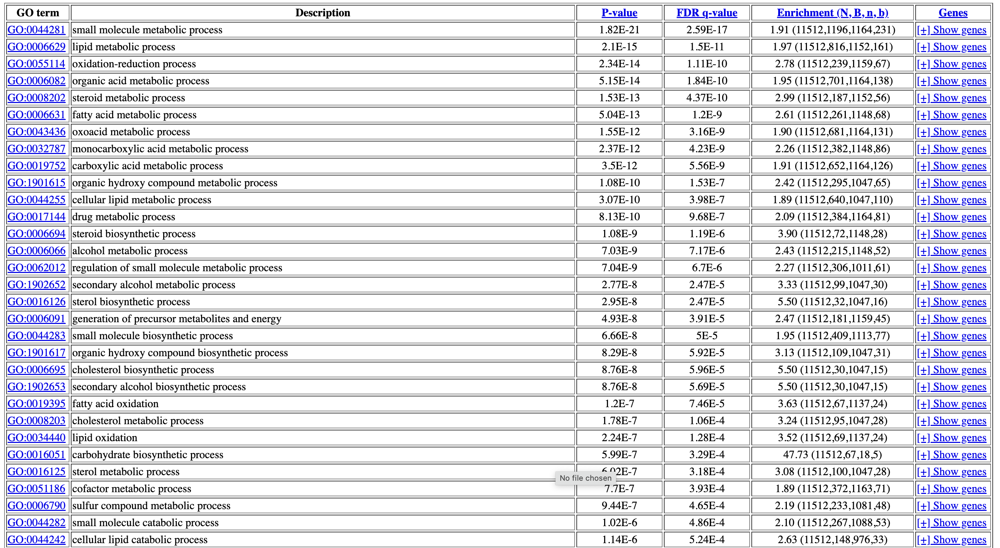
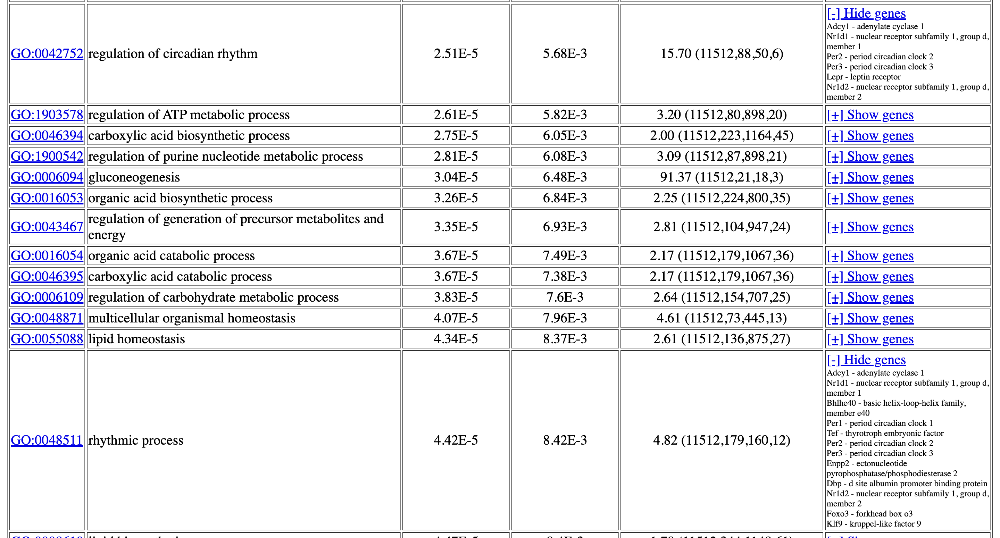

In [38]:
cat deseq.results.tsv | sort -k3,3g | awk '$3 != "NA" {print $1}' | grep -v Gene > deseq.results.sortFCasc.txt

In [39]:
head deseq.results.sortFCasc.txt 

BC023105
Hamp
Mpeg1
Igtp
H2-Ab1
Cd74
H2-Aa
H2-Q6
Pnrc1
Irgm2


### Most down regulated genes

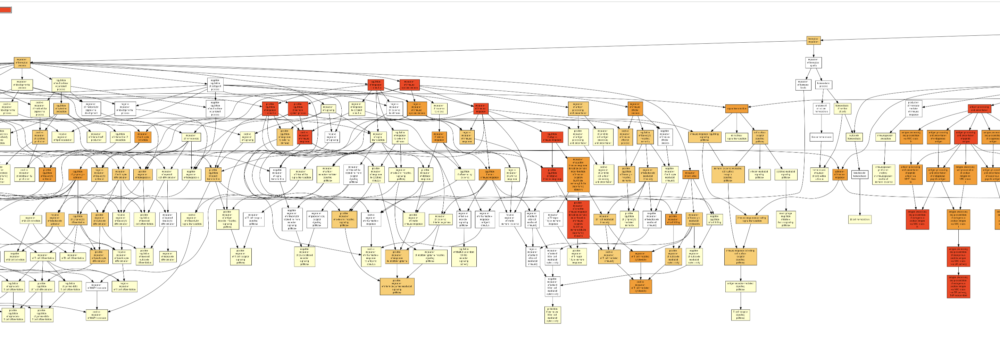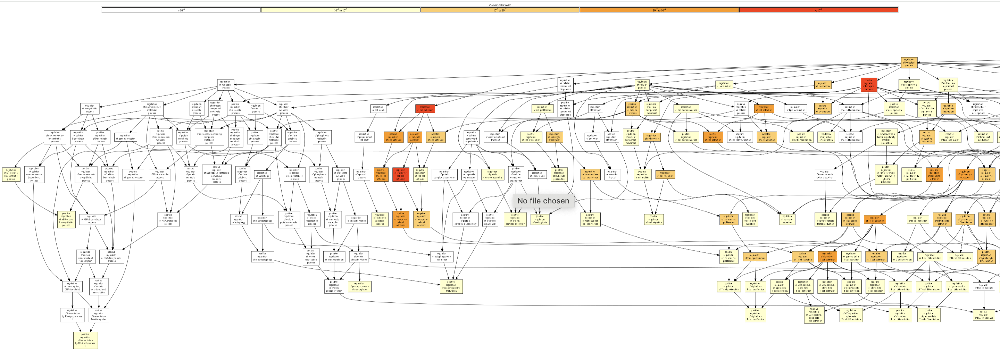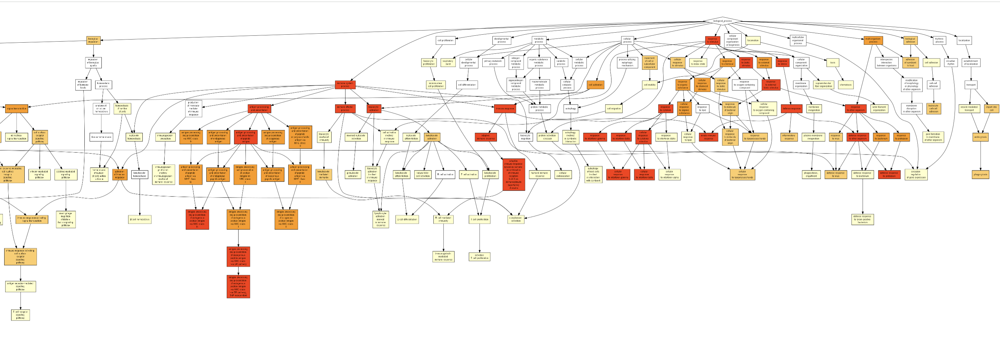

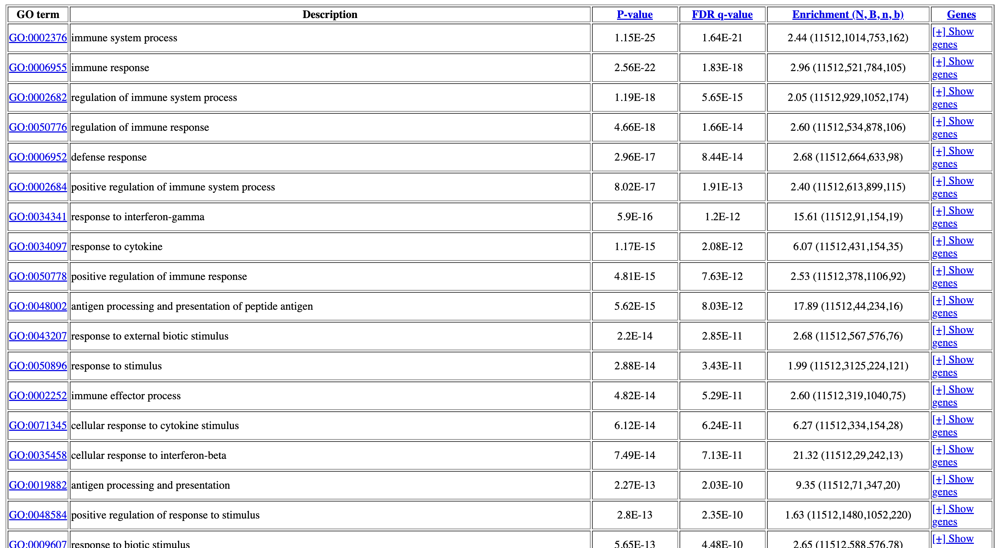

## Enrichr

### GO Biological Process

#### Up regulated genes
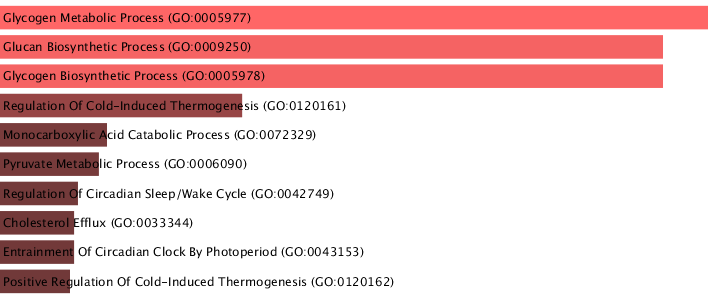

#### Down regulated genes
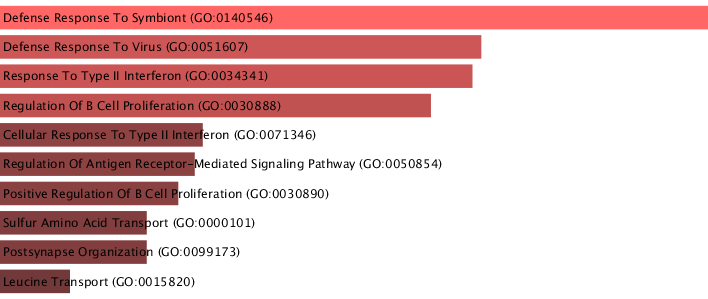 

## Conclusion
Our functional analysis identified three statistically significant genes (adjusted p-value < 5%): Dbp, Meg3, and Rian.

* Dbp was upregulated and plays a role in regulating circadian rhythm genes.
* Meg3 and Rian were downregulated and are classified as non-coding RNA genes.
Meg3 is associated with the regulation of cell growth.
Rian is involved in chromatin organization.
Additionally, when analyzing the data using the non-adjusted p-values, we observed that Exercise Tumor samples had:

Multiple upregulated genes associated with metabolic processes, and
Several downregulated genes related to the immune system process, compared to Non-Exercise Tumor samples.